# Nifty 50 Analysis

## Import the Packages, Functions and Data

In [1]:
import pandas as pd
from EDA_functions import *
from Baseline_functions import *
from DQN_functions import *
import torch
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('data/nifty50.csv')

In [3]:
df = nifty_convert(df)

## EDA

### Visual

In [4]:
EDA(df)

alt.VConcatChart(...)

In [ ]:
#highest closing price row
print("Highest closing price row")
display(df[df['Close'] == df['Close'].max()])

#lowest closing price row
print("Lowest closing price row")
display(df[df['Close'] == df['Close'].min()])

#highest return row
print("Highest return row")
display(df[df['daily_return'] == df['daily_return'].max()])

#lowest return row
print("Lowest return row")
display(df[df['daily_return'] == df['daily_return'].min()])

Highest closing price row


,Open,High,Low,Close,Volume,daily_return,cumulative_return
Date,,,,,,,
2024-03-07,22505.3,22525.65,22430.0,22493.55,379860000.0,0.000868,12.361471


Lowest closing price row


,Open,High,Low,Close,Volume,daily_return,cumulative_return
Date,,,,,,,
2004-05-17,1582.5,1583.8,1292.2,1388.75,1.149700e+11,-0.122377,0.763196


Highest return row


,Open,High,Low,Close,Volume,daily_return,cumulative_return
Date,,,,,,,
2009-05-18,3673.15,4384.3,3673.15,4323.15,2.770000e+09,0.177441,2.375814


Lowest return row


,Open,High,Low,Close,Volume,daily_return,cumulative_return
Date,,,,,,,
2020-03-23,7945.7,8159.25,7583.6,7610.25,6.535400e+11,-0.129805,4.18226


In [ ]:
#correration matrix heatmap, values rounded to 2 decimal places
print("Correlation matrix")
(df.corr()).round(4)

Correlation matrix


,Open,High,Low,Close,Volume,daily_return,cumulative_return
Open,1.0000,0.9999,0.9999,0.9999,0.1744,-0.0086,0.9999
High,0.9999,1.0000,0.9999,0.9999,0.1763,-0.0029,0.9999
Low,0.9999,0.9999,1.0000,0.9999,0.1714,-0.0010,0.9999
Close,0.9999,0.9999,0.9999,1.0000,0.1738,0.0042,1.0000
Volume,0.1744,0.1763,0.1714,0.1738,1.0000,-0.0161,0.1738
daily_return,-0.0086,-0.0029,-0.0010,0.0042,-0.0161,1.0000,0.0042
cumulative_return,0.9999,0.9999,0.9999,1.0000,0.1738,0.0042,1.0000


In [ ]:
(df.describe()).round(4)

,Open,High,Low,Close,Volume,daily_return,cumulative_return
count,4964.0000,4964.0000,4964.0000,4964.0000,4.964000e+03,4964.0000,4964.0000
mean,8304.5473,8352.4225,8244.5905,8300.0031,2.063814e+11,0.0006,4.5613
std,5038.1693,5051.5783,5015.1127,5034.2012,1.803064e+11,0.0136,2.7666
min,1392.9500,1474.3000,1292.2000,1388.7500,4.503000e+07,-0.1298,0.7632
25%,4795.8250,4855.2750,4742.6375,4800.5500,9.902000e+10,-0.0053,2.6382
50%,6503.0750,6543.6750,6486.5000,6514.2750,1.595350e+11,0.0009,3.5800
75%,10888.6500,10935.0125,10817.6375,10887.1875,2.507725e+11,0.0072,5.9831
max,22517.5000,22526.6000,22430.0000,22493.5500,1.810970e+12,0.1774,12.3615


### Without Differencing

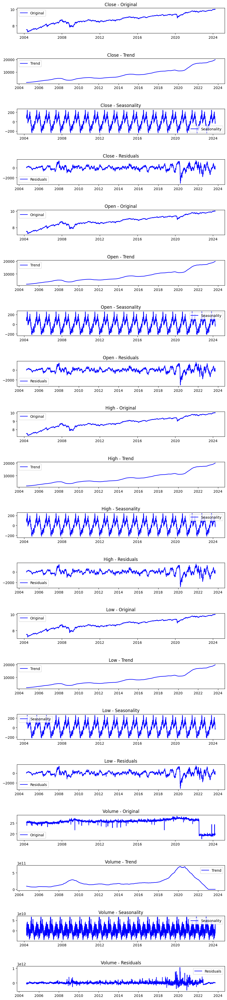

In [6]:
decomposition_plot(df,0)


Results of Dickey-Fuller Test for Close: 

Test Statistic                    1.349098
p-value                           0.996870
#Lags Used                       12.000000
Number of Observations Used    4951.000000
Critical Value (1%)              -3.431671
Critical Value (5%)              -2.862124
Critical Value (10%)             -2.567081
dtype: float64

Results of Dickey-Fuller Test for Open: 

Test Statistic                    1.257002
p-value                           0.996357
#Lags Used                        9.000000
Number of Observations Used    4954.000000
Critical Value (1%)              -3.431671
Critical Value (5%)              -2.862124
Critical Value (10%)             -2.567081
dtype: float64

Results of Dickey-Fuller Test for High: 

Test Statistic                    1.544353
p-value                           0.997681
#Lags Used                       32.000000
Number of Observations Used    4931.000000
Critical Value (1%)              -3.431677
Critical Value (5%)    

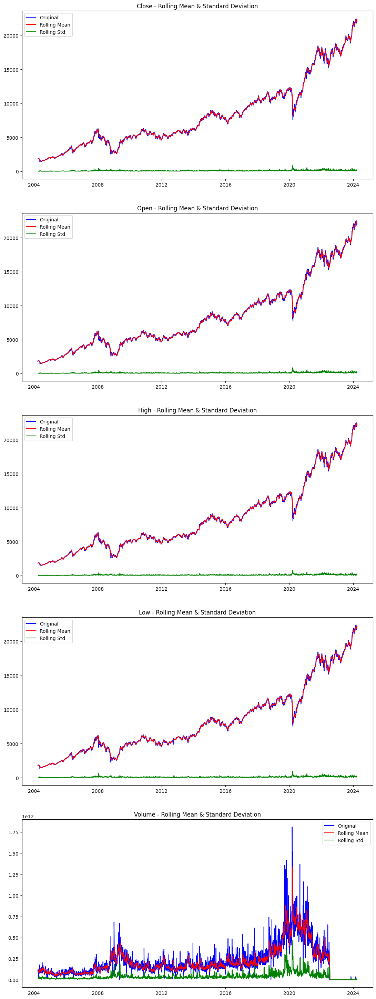

In [7]:
stationarity_check(df,0)

In [8]:
normality_check(df,0)


Normality Check for Close:
Jarque-Bera Test ---- statistic: 675.0280993795265, p-value: 2.627305983610334e-147
Normal Test ---- statistic: 504.81198903098834, p-value: 2.406962824292277e-110

Normality Check for Open:
Jarque-Bera Test ---- statistic: 672.5233009814369, p-value: 9.192226483189286e-147
Normal Test ---- statistic: 503.39954159348014, p-value: 4.8772885117458017e-110

Normality Check for High:
Jarque-Bera Test ---- statistic: 673.6864999374262, p-value: 5.138487119485244e-147
Normal Test ---- statistic: 504.0545220377235, p-value: 3.515209799811577e-110

Normality Check for Low:
Jarque-Bera Test ---- statistic: 674.4503951127173, p-value: 3.5071758545352347e-147
Normal Test ---- statistic: 504.4742920987259, p-value: 2.8497012949038815e-110

Normality Check for Volume:
Jarque-Bera Test ---- statistic: 14973.34962164349, p-value: 0.0
Normal Test ---- statistic: 2330.364945660487, p-value: 0.0


### After 1st Difference

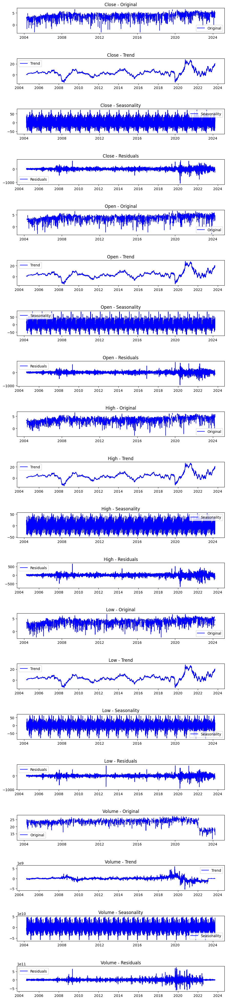

In [9]:
decomposition_plot(df,1)


Results of Dickey-Fuller Test for Close: 

Test Statistic                  -19.647957
p-value                           0.000000
#Lags Used                       11.000000
Number of Observations Used    4951.000000
Critical Value (1%)              -3.431671
Critical Value (5%)              -2.862124
Critical Value (10%)             -2.567081
dtype: float64

Results of Dickey-Fuller Test for Open: 

Test Statistic                  -22.405511
p-value                           0.000000
#Lags Used                        8.000000
Number of Observations Used    4954.000000
Critical Value (1%)              -3.431671
Critical Value (5%)              -2.862124
Critical Value (10%)             -2.567081
dtype: float64

Results of Dickey-Fuller Test for High: 

Test Statistic                -1.296929e+01
p-value                        3.105619e-24
#Lags Used                     3.100000e+01
Number of Observations Used    4.931000e+03
Critical Value (1%)           -3.431677e+00
Critical Value (5%

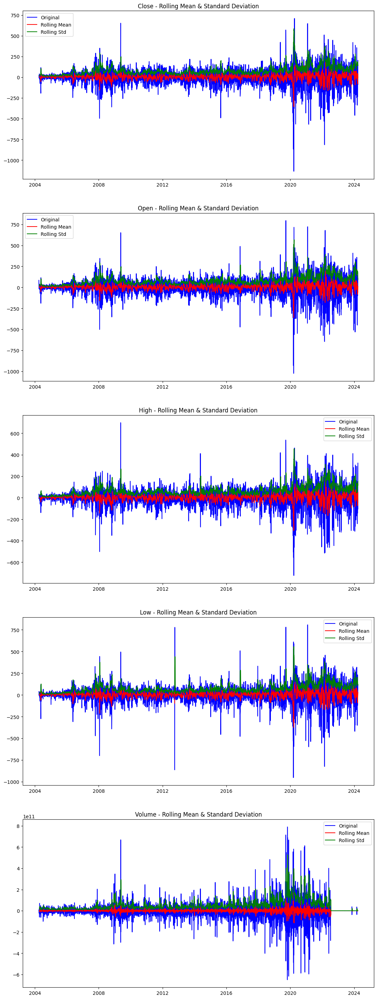

In [10]:
stationarity_check(df,1)

In [11]:
normality_check(df,1)


Normality Check for Close:
Jarque-Bera Test ---- statistic: 25543.62376715562, p-value: 0.0
Normal Test ---- statistic: 1277.024504287748, p-value: 4.984851972906545e-278

Normality Check for Open:
Jarque-Bera Test ---- statistic: 17557.510960948526, p-value: 0.0
Normal Test ---- statistic: 1002.1084647886211, p-value: 2.482628501135881e-218

Normality Check for High:
Jarque-Bera Test ---- statistic: 12758.849700421077, p-value: 0.0
Normal Test ---- statistic: 932.5741580658379, p-value: 3.1195689800938485e-203

Normality Check for Low:
Jarque-Bera Test ---- statistic: 31282.289131704096, p-value: 0.0
Normal Test ---- statistic: 1324.7749362826846, p-value: 2.1319533835605802e-288

Normality Check for Volume:
Jarque-Bera Test ---- statistic: 102226.04839281146, p-value: 0.0
Normal Test ---- statistic: 1527.026729312884, p-value: 0.0


### Outlier Check

Since price gradually increases, it does not make sense to use traditional outlier checking methods. Therefore we calculate the daily change and then the outliers in those

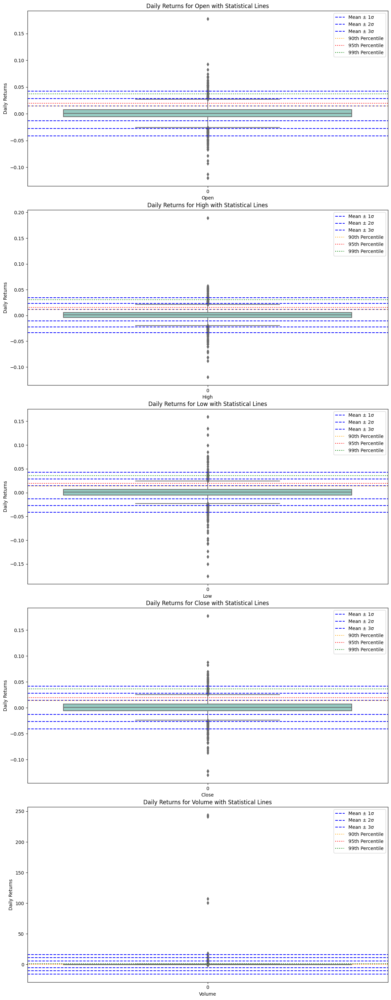

In [12]:
daily_returns(df)

## Outlier Removal 


In [4]:
df['daily_return'] = df['Close'].pct_change()
df['daily_return'] = df['daily_return'].fillna(0)
#mean plus 3sigma value for absolute daily returns
mean = df['daily_return'].mean()
std = df['daily_return'].std()
upper_limit = mean + 2*std
lower_limit = mean - 2*std
print(f'Mean: {mean}, Std: {std}, Upper Limit: {upper_limit}, Lower Limit: {lower_limit}')
#number of rows that are outside the 3 sigma range
print(f'Number of rows outside 2 sigma range: {len(df[(df["daily_return"]>upper_limit) | (df["daily_return"]<lower_limit)])}')
print(f'Percentage of rows outside 2 sigma range: {len(df[(df["daily_return"]>upper_limit) | (df["daily_return"]<lower_limit)])/len(df)*100}% ')

#if daily return is outside 3 sigma range, replace all the values with previous day's values
for i in range(1,len(df)):
    if df['daily_return'][i]>upper_limit or df['daily_return'][i]<lower_limit:
        df['Close'][i] = df['Close'][i-1]
        df['Open'][i] = df['Open'][i-1]
        df['High'][i] = df['High'][i-1]
        df['Low'][i] = df['Low'][i-1]
        df['Volume'][i] = df['Volume'][i-1]
        df['daily_return'][i] = 'NaN'

Mean: 0.0005985155699039544, Std: 0.01364459026906905, Upper Limit: 0.027887696108042054, Lower Limit: -0.026690664968234145
Number of rows outside 2 sigma range: 233
Percentage of rows outside 2 sigma range: 4.693795326349718% 


## Baseline Models


In [29]:
df_baseline = calculate_macd_signals(df)

Total Pofit: 730.9435845387073
Final Capital: 830.9435845387073
Overall Return: 730.9435845387073
Overall Return %: 730.9435845387073
Number of Days: 4963
Number of Trades: 728
Ratio of Trades to Days:  0.1466854724964739


In [30]:
df_base = profit_trades(df_baseline)

Total Pofit: 141646682.4619513
Final Capital: 141646782.4619513
Overall Return: 141646682.4619513
Overall Return %: 141646682.4619513
Number of Days: 4963
Number of Trades: 698
Ratio of Trades to Days:  0.14064074148700384


In [31]:
df_base = loss_trades(df_baseline)

Total Pofit: -99.9992875501282
Final Capital: 0.0007124498717969408
Overall Return: -99.9992875501282
Overall Return %: -99.9992875501282
Number of Days: 4963
Number of Trades: 691
Ratio of Trades to Days:  0.13923030425146082


## DQN

### Training

In [8]:
df_base = df[['Open','High','Low','Close','Volume']]
#include 26 and 12 ema
df_base['26ema'] = df_base['Close'].ewm(span=26).mean()
df_base['12ema'] = df_base['Close'].ewm(span=12).mean()
#fill na as 0
df_base = df_base.dropna()
df_base = df_base[['Open','High','Low','Close','Volume','26ema','12ema']]

#first 80% of the data is train
df_train = df_base.iloc[:int(len(df_base)*0.8)]
#last 20% of the data is test
df_test = df_base.iloc[int(len(df_base)*0.8):]

In [9]:
display(df_train.head())

display(df_test.head())

,Open,High,Low,Close,Volume,26ema,12ema
Date,,,,,,,
2004-04-01,1771.45,1823.05,1771.45,1819.65,1.110700e+11,1819.650000,1819.650000
2004-04-02,1856.10,1856.30,1809.00,1841.10,1.187400e+11,1830.787500,1831.268750
2004-04-05,1841.10,1878.80,1840.00,1856.60,1.026000e+11,1840.061681,1841.155543
2004-04-06,1870.80,1876.15,1836.90,1851.15,1.094100e+11,1843.161490,1844.310402
2004-04-07,1856.40,1865.20,1833.95,1848.70,8.626000e+10,1844.445893,1845.503040


,Open,High,Low,Close,Volume,26ema,12ema
Date,,,,,,,
2020-03-31,8949.10,9038.90,8522.9,8660.25,8.014500e+11,9640.650474,8780.106621
2020-04-01,8949.10,9038.90,8522.9,8660.25,8.014500e+11,9568.028216,8761.667141
2020-04-03,8356.55,8356.55,8055.8,8083.80,6.970300e+11,9458.085386,8657.379888
2020-04-07,8356.55,8356.55,8055.8,8083.80,6.970300e+11,9356.286468,8569.136829
2020-04-08,8688.90,9131.70,8653.9,8748.75,8.965300e+11,9311.283767,8596.769624


In [10]:
print(df_train.shape, df_test.shape)
print(df_train.shape[0] + df_test.shape[0])
print(df.shape[0])

(3971, 7) (993, 7)
4964
4964


In [11]:
window_size = 26
states = create_states(df_train, window_size)
test_states = create_states(df_test, window_size)
input_dim_conv = states.shape[2]
output_dim = 3
print("Shape of states:", states.shape)

Shape of states: (3945, 26, 7)


In [21]:
model = ConvDQN(input_dim_conv, output_dim, window_size)
memory = ReplayMemory(50000)
agent = DQNAgent(input_dim_conv, output_dim, window_size,model, lr=0.0001, gamma=0.95, epsilon=1.0, epsilon_min=0.01, epsilon_decay=0.9995)

Episode 1/800, Total Reward: -430.15050000000093, Loss: 38.448816323031956
Episode 2/800, Total Reward: -40.54499999999935, Loss: 33.87743045290528
Episode 3/800, Total Reward: -228.59961187050055, Loss: 32.5549475681257
Episode 4/800, Total Reward: -425.42256476601034, Loss: 31.168468696432996
Episode 5/800, Total Reward: -228.59961187050055, Loss: 29.768452046157197
Episode 6/800, Total Reward: 14.299999999999272, Loss: 25.81787884402999
Episode 7/800, Total Reward: -205.7396506834505, Loss: 25.17816281056475
Episode 8/800, Total Reward: -1174.8999999999996, Loss: 24.30132203108051
Episode 9/800, Total Reward: -6.022681420793124, Loss: 18.932273721227332
Episode 10/800, Total Reward: 62.95582946250002, Loss: 14.9360776497998
Episode 11/800, Total Reward: -2809.0395, Loss: 9.763314847098435
Episode 12/800, Total Reward: -2.999399216913107e-06, Loss: 9.037675824865007
Episode 13/800, Total Reward: 6.402515524993822, Loss: 9.771989582177964
Episode 14/800, Total Reward: 208.177249500000

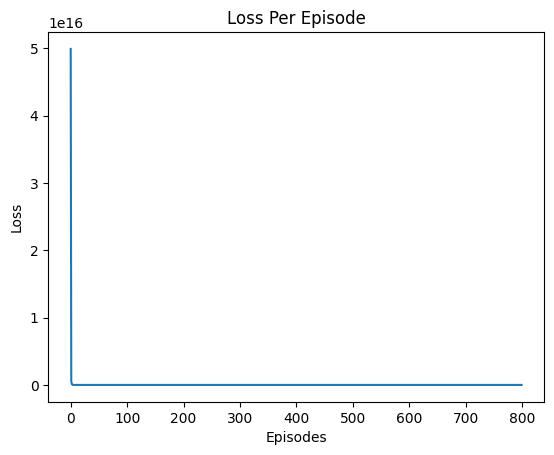

CPU times: user 1d 6h 53min 37s, sys: 8h 10min 33s, total: 1d 15h 4min 11s
Wall time: 10h 36min 30s


In [22]:
%%time
log_train = train_agent(agent, states, 800, batch_size=32)

In [23]:
log_train.to_csv('NIFTY50/log_train_CNN_reward_MA_800ep.csv', index=False)

In [24]:
#save the model
torch.save(agent.model.state_dict(), 'NIFTY50/DQN_CNN_reward_MA_800ep.pth')

### Evaluating and Testing

In [12]:
log_train = pd.read_csv('NIFTY50/log_train_CNN_reward_MA_800ep.csv')

In [13]:
log_train.rename(columns={'Reward':'Training_reward'}, inplace=True)

In [14]:
reward =[]
for i in range(1,log_train['Episode'].max()+1):
    last_episode = log_train[log_train['Episode'] == i]
    last_episode.reset_index(drop=True, inplace=True)
    last_episode['Close'] = last_episode['Price'].to_list()
    reward.append(list(capital_calculation(last_episode,'Action'))[-1]-100)

Total Pofit: 316.86005220686627
Total Pofit: -2.6887533306138494
Total Pofit: 56.80763029706776
Total Pofit: 69.58274118425138
Total Pofit: 63.26891228396093
Total Pofit: 48.67782227900159
Total Pofit: 144.9949641323558
Total Pofit: 163.02809672121822
Total Pofit: 184.70847984712185
Total Pofit: 179.75434229364822
Total Pofit: 26.573748840604196
Total Pofit: -15.110866972256844
Total Pofit: 7.512790872799883
Total Pofit: -18.282122406509984
Total Pofit: 27.25033090238098
Total Pofit: 44.610820351940816
Total Pofit: 166.092907194754
Total Pofit: 4.677100954585782
Total Pofit: 43.72663621322741
Total Pofit: 45.81833523411686
Total Pofit: 50.41602483465323
Total Pofit: 48.29549559400206
Total Pofit: 6.430985902079769
Total Pofit: -23.464424631506006
Total Pofit: 13.540028528456318
Total Pofit: 94.06780461181947
Total Pofit: 48.870840265721824
Total Pofit: -3.009154996728512
Total Pofit: 14.519808273231604
Total Pofit: 25.309692776148722
Total Pofit: 11.380789436946202
Total Pofit: 19.9630

Total Pofit: -18.108050179485716
Total Pofit: 128.23838346651064
Total Pofit: 81.68065516087103
Total Pofit: 2.7183019431353443
Total Pofit: 85.74607693949656
Total Pofit: 8.122243692719067
Total Pofit: -7.525096908677497
Total Pofit: 0.8725109478482409
Total Pofit: 1.8413221828618447
Total Pofit: -8.770066119297809
Total Pofit: -20.487307695991618
Total Pofit: -12.124646978594726
Total Pofit: -56.91360183188445
Total Pofit: 172.95224463972795
Total Pofit: 15.700666735335261
Total Pofit: 204.1783605143824
Total Pofit: 142.50565511254337
Total Pofit: 17.786011186926302
Total Pofit: 172.6840312454268
Total Pofit: 52.27953679635672
Total Pofit: 391.6146504094145
Total Pofit: 334.9090162615597
Total Pofit: 398.79896376925257
Total Pofit: 244.1533640434775
Total Pofit: 337.67100538926445
Total Pofit: 346.1589375426993
Total Pofit: 378.44846191357453
Total Pofit: 274.43346430152536
Total Pofit: 330.5261014255921
Total Pofit: 340.4245662815697
Total Pofit: 283.4578573028964
Total Pofit: 111.8

Total Pofit: -5.150366057439896
Total Pofit: -5.465689664859056
Total Pofit: -2.110455944803107
Total Pofit: 4.207438794566585
Total Pofit: 2.76797159393125
Total Pofit: 1.3367290697485288
Total Pofit: -4.7648130526866765
Total Pofit: 4.555703761779952
Total Pofit: 11.489486619007863
Total Pofit: 6.516312386967371
Total Pofit: -4.702841379396489
Total Pofit: -1.6904016104011106
Total Pofit: -3.916660800153494
Total Pofit: -1.128122911178508
Total Pofit: 1.7182083603976395
Total Pofit: 1.5970570752983662
Total Pofit: -1.8010361895287588
Total Pofit: 0.893041985931049
Total Pofit: 3.348382494379635
Total Pofit: 7.790741580763068
Total Pofit: 5.504830781105355
Total Pofit: -0.3289517542614959
Total Pofit: 3.7428994506285704
Total Pofit: 0.7078188137015502
Total Pofit: 0.2519547532520363
Total Pofit: -0.5683450685816922
Total Pofit: -0.05209770814552428
Total Pofit: -1.0765598772545957
Total Pofit: 7.984234260026923
Total Pofit: 7.844799565062473
Total Pofit: 6.118940003434673
Total Pofit:

Total Pofit: 0.4823089329124315
Total Pofit: -0.16647379251551797
Total Pofit: -0.7903237969743628
Total Pofit: -3.411922118811333
Total Pofit: -7.663110245462491
Total Pofit: 5.012656942499305
Total Pofit: -1.8576075802876204
Total Pofit: -1.8500372291936031
Total Pofit: -3.626619438963658
Total Pofit: -0.3680208673915786
Total Pofit: 4.461417491277388
Total Pofit: -0.26974723010019375
Total Pofit: 6.9642457471200885
Total Pofit: -0.02314214713281615
Total Pofit: 0.2793288880361473
Total Pofit: -3.6782582796138144
Total Pofit: -0.6060928794081235
Total Pofit: 6.702377756962974
Total Pofit: -3.3278585594856764
Total Pofit: 2.4270852122736812


In [15]:
log_train['Reward'] = log_train['Episode'].apply(lambda x: reward[x-1])

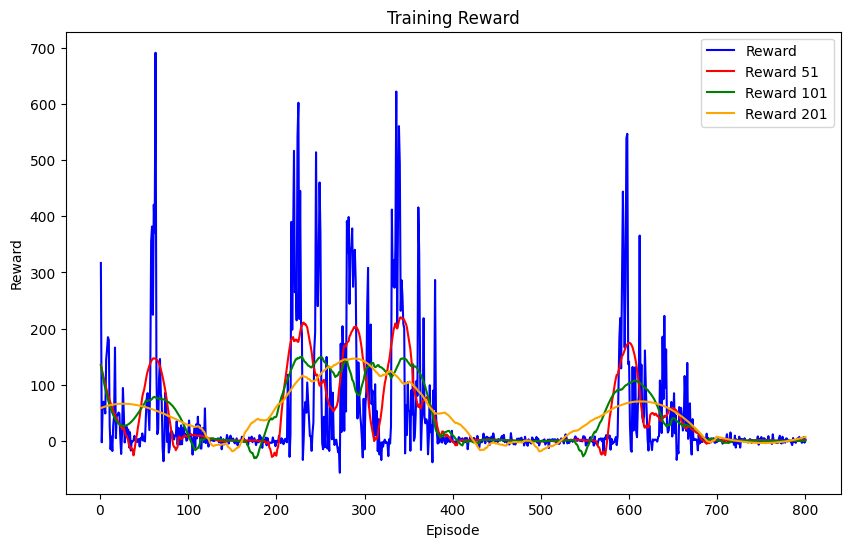

In [16]:
reward_filter(reward)

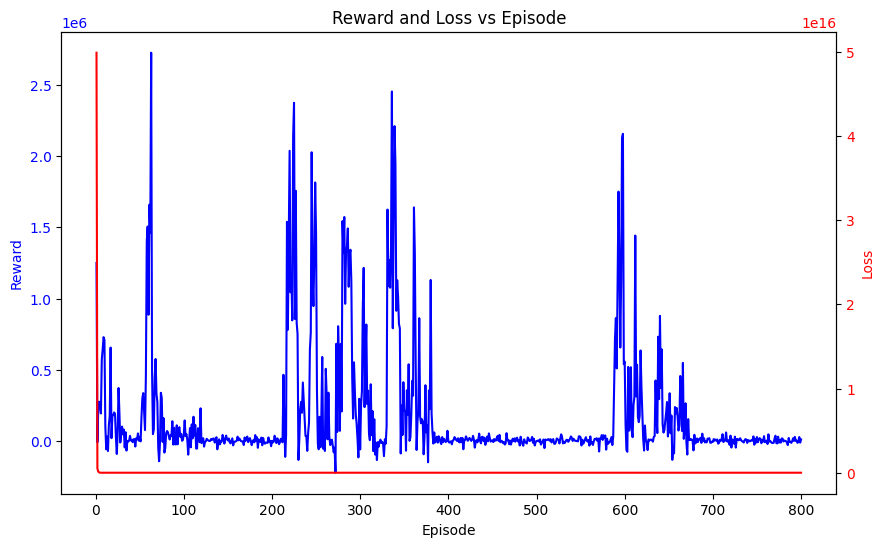

In [17]:
plot_training(log_train)

Number of Trades:  8


<Axes: >

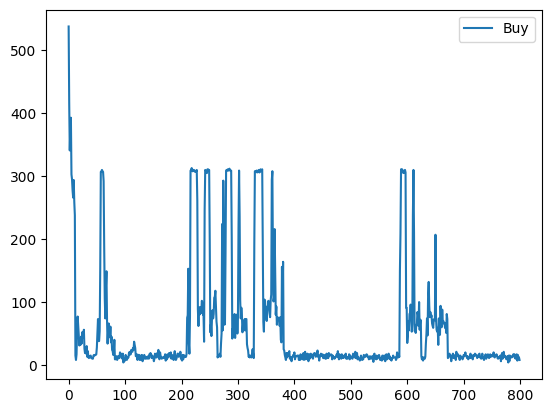

In [18]:
action_episode_df = create_action_episode_df(log_train)

action_episode_df = action_episode_df.apply(pd.Series.value_counts).transpose().reset_index()

print("Number of Trades: ", list(action_episode_df['Buy'])[-1])
#get value counts of all columns in the DataFrame
action_episode_df[['Buy']].plot()

In [19]:
# Initialize the agent
test_state_size = test_states.shape[2]
action_size = 3
model = ConvDQN(input_dim_conv, output_dim, window_size)
agent = DQNAgent(test_state_size, output_dim, window_size,model, lr=0.0001, gamma=0.95, epsilon=0, epsilon_min=0, epsilon_decay=0.9995)

In [20]:
model_path = 'NIFTY50/DQN_CNN_reward_MA_800ep.pth'
agent.model.load_state_dict(torch.load(model_path))

# Ensure the model is in evaluation mode
agent.model.eval()

ConvDQN(
  (conv1): Conv1d(7, 32, kernel_size=(3,), stride=(1,), padding=(1,))
  (conv2): Conv1d(32, 64, kernel_size=(3,), stride=(1,), padding=(1,))
  (fc1): Linear(in_features=1664, out_features=128, bias=True)
  (fc2): Linear(in_features=128, out_features=3, bias=True)
)

In [21]:
evaluation_log = evaluate_agent(agent, test_states)
evaluation_log['Close'] = evaluation_log['Price']
evaluation_log['Capital'] = capital_calculation(evaluation_log, 'Action')

Total Pofit: 5.173443177511629


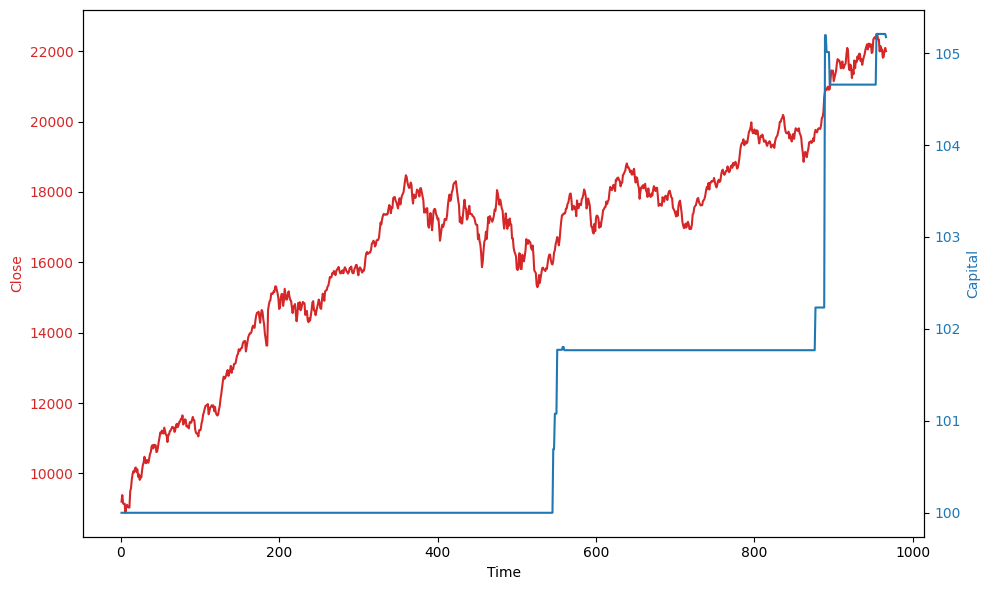

In [22]:
plot_dual_axis(evaluation_log)

In [23]:
print(f"Return without DQN: {(evaluation_log['Close'].iloc[-1] - evaluation_log['Close'].iloc[0])/evaluation_log['Close'].iloc[0] }%")
print(f"Return with DQN: {(evaluation_log['Capital'].iloc[-1] - 100)/100 }%")

Return without DQN: 1.3927124845730194%
Return with DQN: 0.051734431775116295%


In [24]:
all_states = create_states(df_base, window_size)
all_states_eval = evaluate_agent(agent, all_states)

In [25]:
all_states_eval['Close'] = all_states_eval['Price']
all_states_eval['Capital'] = capital_calculation(all_states_eval, 'Action')

Total Pofit: 5.173443177511629


In [26]:
print(f'Return without trading: {(all_states_eval["Close"].iloc[-1] - all_states_eval["Close"].iloc[0])/all_states_eval["Close"].iloc[0]}')
print(f"Return on Investment: {(all_states_eval['Capital'].iloc[-1] - 100)/100}")

Return without trading: 11.43835848736646
Return on Investment: 0.051734431775116295


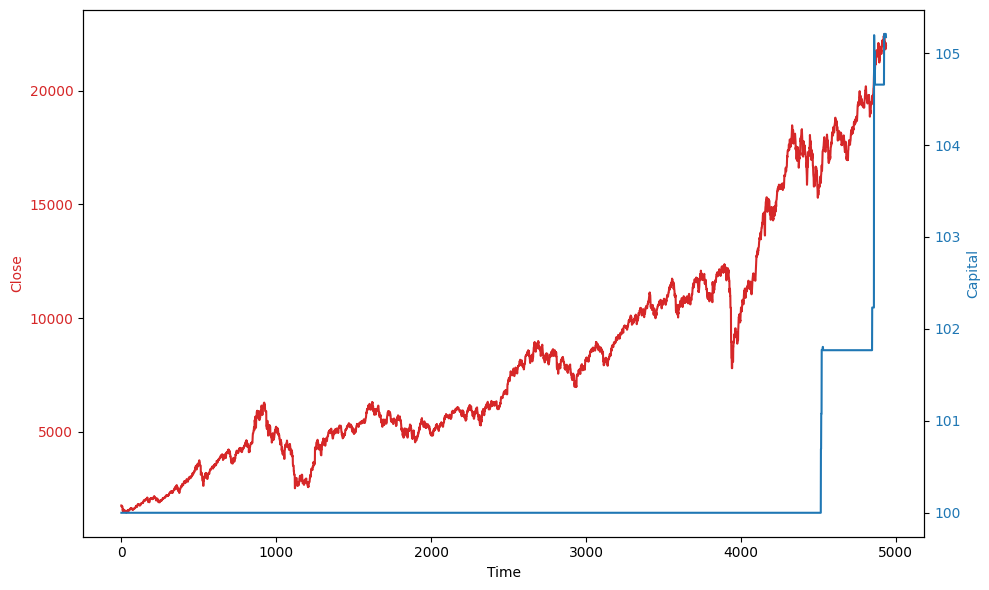

In [27]:
plot_dual_axis(all_states_eval)

In [32]:
evaluation_log['Date']= df_test.tail(evaluation_log.shape[0]).index
all_states_eval['Date'] = df.tail(all_states_eval.shape[0]).index
df_baseline['Date'] = df_baseline.index

In [33]:
eval_trade_summary = generate_trade_summary(evaluation_log,'Action','Price')
eval_trade_summary['Profit_Loss'].value_counts()

Profit    7
Loss      4
Name: Profit_Loss, dtype: int64

In [34]:
all_states_eval_trade_summary = generate_trade_summary(all_states_eval,'Action','Price')
all_states_eval_trade_summary['Profit_Loss'].value_counts()


Profit    7
Loss      4
Name: Profit_Loss, dtype: int64

In [35]:
macd_trade_summary = generate_trade_summary(df_baseline,'MACD_Trades','Close')
macd_trade_summary['Profit_Loss'].value_counts()

Profit    194
Loss      170
Name: Profit_Loss, dtype: int64

In [36]:
test_trades = test_trades_summary(df_test, evaluation_log)

Total Pofit: 56.35823329817134
Final Capital: 156.35823329817134
Overall Return: 56.35823329817134
Overall Return %: 56.35823329817134
Number of Days: 992
Number of Trades: 138
Ratio of Trades to Days:  0.13911290322580644

--- Test Trades Summary ---
Return without DQN: 1.578%
Return with DQN: 5.173%
Return with MACD: 56.358%
Return with Combined Capital: 61.532%
